# IMPORTS

In [2]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## FUNCTIONS

In [11]:
def plot_pae(pae_mat, ticks, mintick = 0, maxtick = None, tick_interval = 500, DPI = 150, out = None):
    if maxtick == None:
        maxtick = len(pae_mat)
    plt.rcParams.update({"axes.linewidth": 10, 'axes.edgecolor': 'black'})
    fig, ax = plt.subplots(1, 1, figsize = (7.5, 7.5), dpi = DPI)
    sns.heatmap(pae_mat, cmap = "Greens_r", edgecolor= "k", square = True)
    plt.xlabel("Scored residue")
    plt.ylabel("Aligned residue")
    
    plt.xticks(ticks, ticks, rotation = 0)
    plt.yticks(ticks, ticks)

    for tick in ticks[1:-1]:
        plt.axhline(y=tick, linestyle = '--', c = "k", linewidth = 1)
        plt.axvline(x=tick, linestyle = '--', c = "k", linewidth = 1)
    if out != None:
        plt.savefig(out)
    plt.show()

In [4]:
data_dir = "./../"

## FAM83G AFM DIMER MODEL

In [12]:
data_dir2 = os.path.join(data_dir, "FAM83_dimers/fam83g_dimer/colabfold_output")

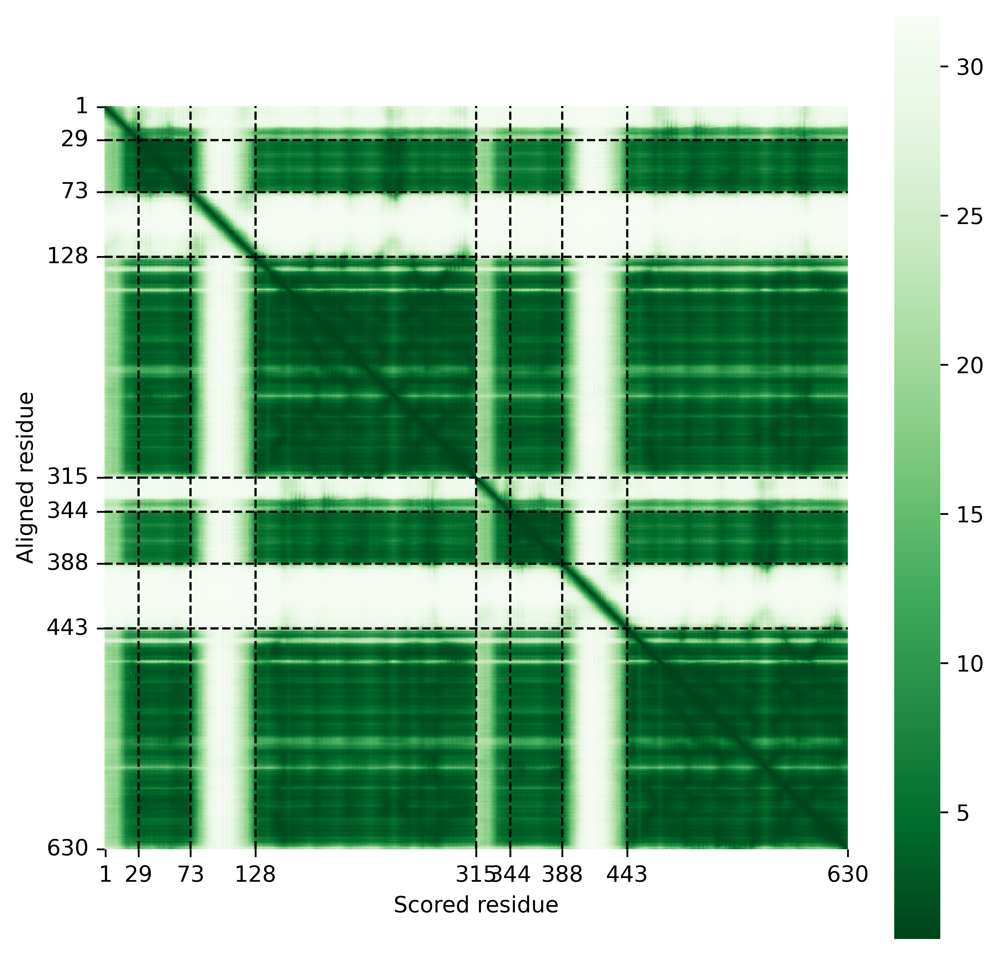

In [13]:
pae2 = pd.read_json(os.path.join(data_dir2, "hFAM83G_scores_rank_001_alphafold2_multimer_v3_model_1_seed_000.json"))
pae_list2 = pae2["pae"].tolist()
pae_mat2 = round(pd.DataFrame(pae_list2),2)
plot_pae(pae_mat2, ticks = [1, 29, 73, 128, 315, 344, 388, 443, 630], tick_interval = 50, DPI = 600, out = "./png/FAM83G_AFM_dimer_PAE.png")

## FAM83G AFM DIMER MODEL (1 copy)

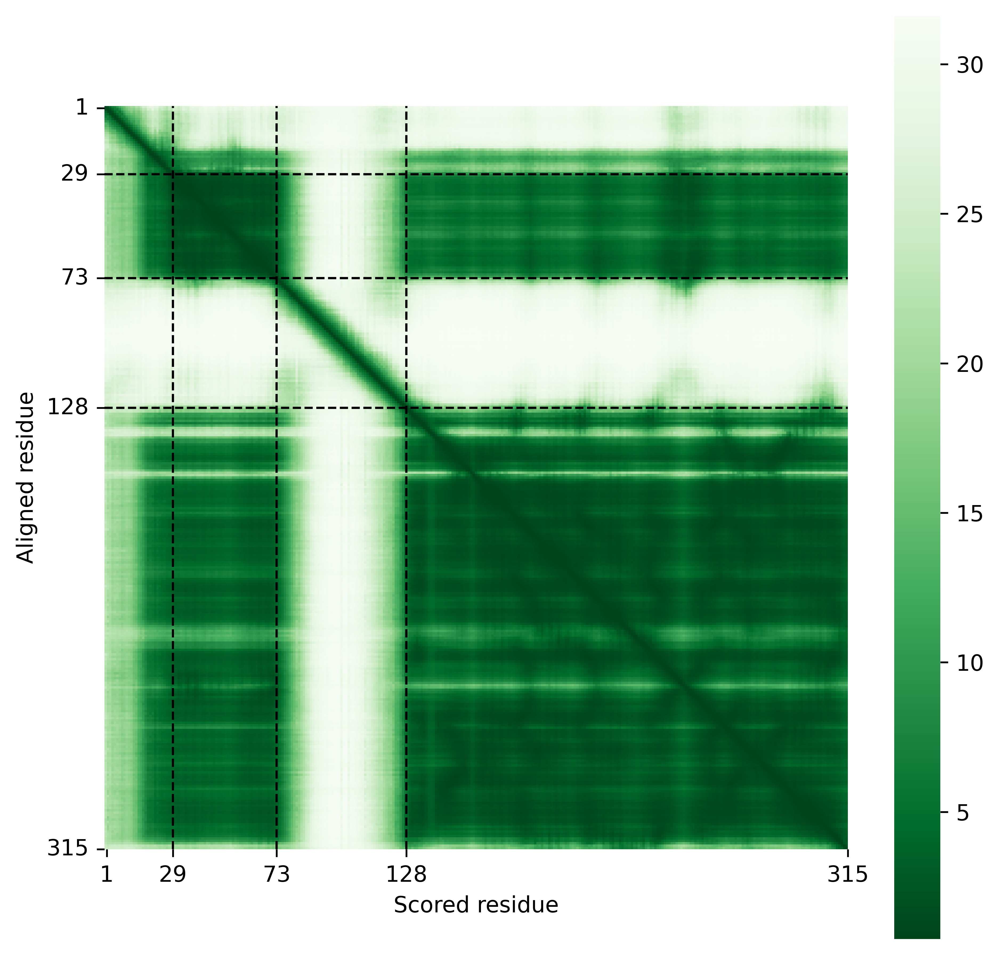

In [16]:
pae_mat3 = pae_mat2.iloc[:315, :315]
plot_pae(pae_mat3, ticks = [1, 29, 73, 128, 315], tick_interval = 50, DPI = 600, out = "./png/FAM83G_AFM_dimer_1copy_PAE.png")

## FAM83G AFDB MONOMER MODEL

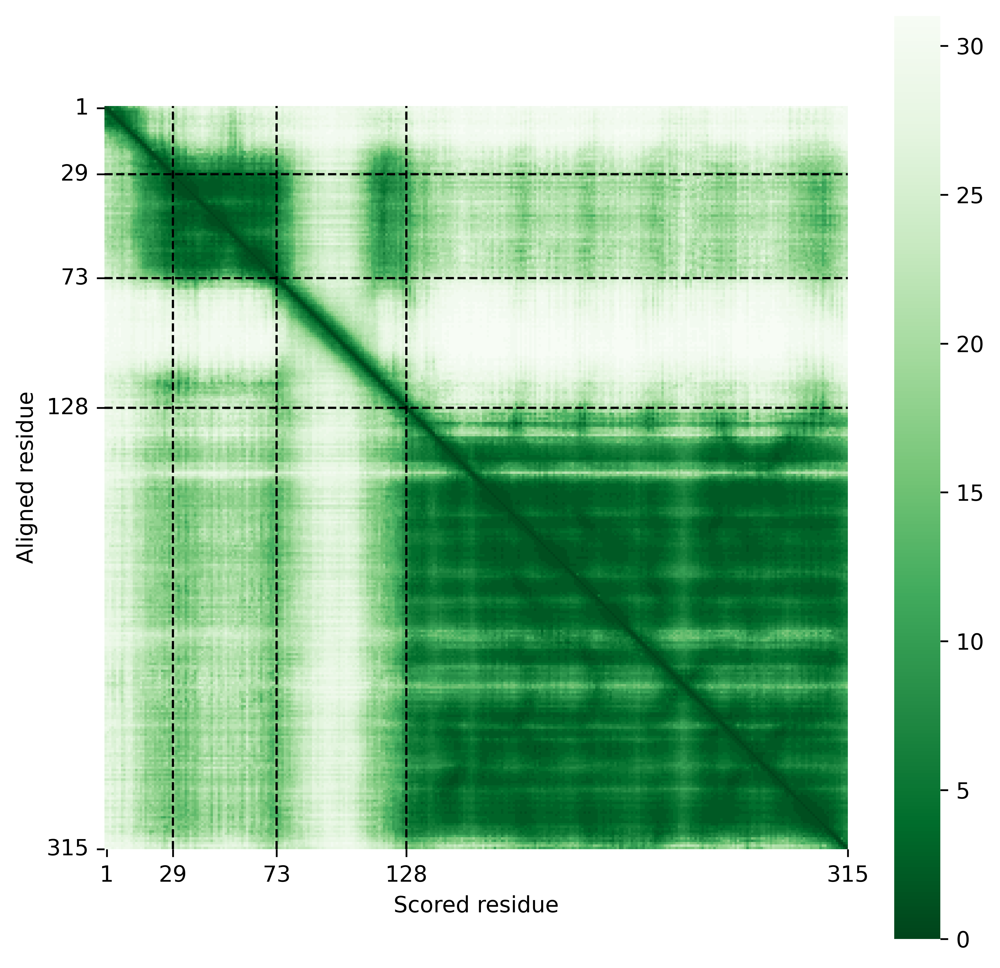

In [15]:
data_dir3 = os.path.join(data_dir, "AFDB_FAM83G_model")

pae4 = pd.read_json(os.path.join(data_dir3, "AF-A6ND36-F1-predicted_aligned_error_v4.json"))
pae_mat4 = pd.DataFrame(pae4["predicted_aligned_error"][0])
plot_pae(pae_mat4.iloc[:315, :315], ticks = [1, 29, 73, 128, 315], tick_interval = 50, DPI = 600, out = "./png/FAM83G_AFDB_monomer_PAE.png")

## FAM83G DIMER + CK1A AFM MODEL

In [9]:
data_dir1 = os.path.join(data_dir, "FAM83G_CK1A/MODELS/full_FAM83G/colabfold_output")

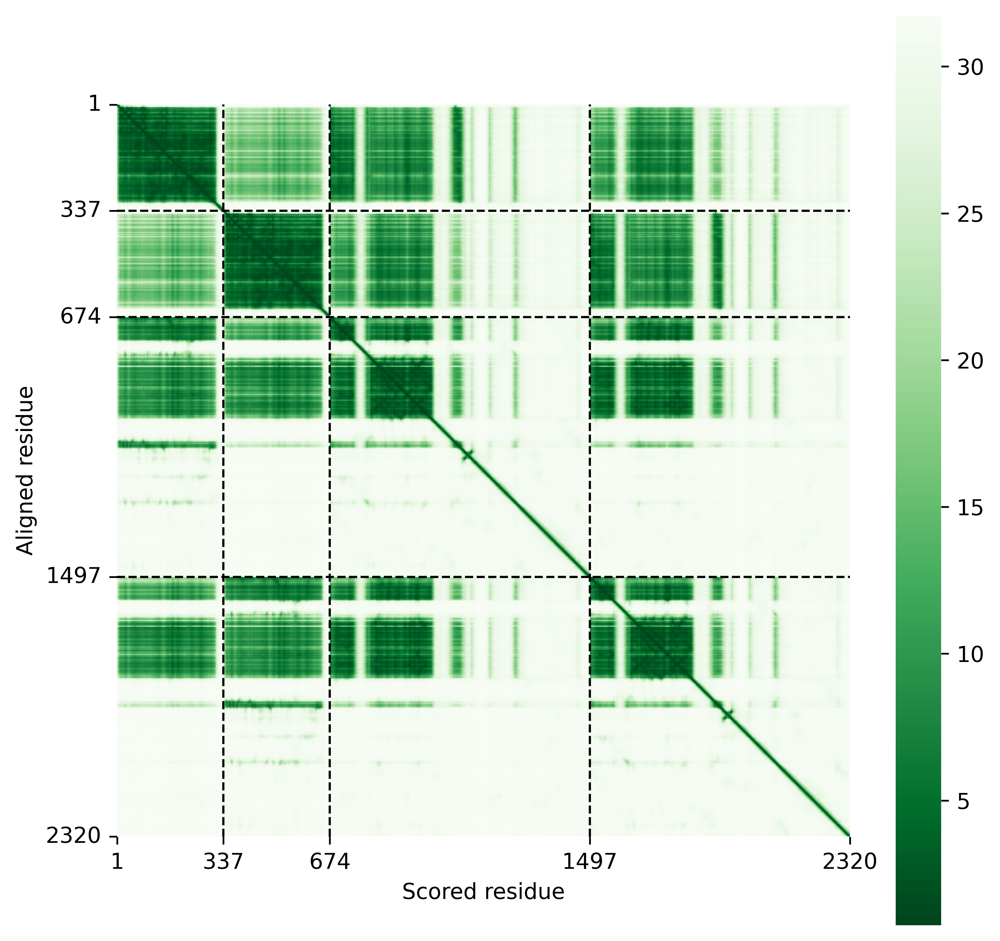

In [14]:
pae = pd.read_json(os.path.join(data_dir1, "full_FAM83G_dimer__CK1a_subs_scores_rank_004_alphafold2_multimer_v3_model_2_seed_000.json"))
pae_list = pae["pae"].tolist()
pae_mat = round(pd.DataFrame(pae_list),2)
plot_pae(pae_mat, ticks = [1, 337, 674, 1497, 2320], tick_interval = 250, DPI = 600, out = "./png/FAM83G_CK1A_AFM_tetramer_PAE.png")